# Install Dependencies

In [ ]:
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip install albumentations
!pip install pycocotools==2.0.2
!pip install -q torch torchvision
!pip install torchvision
!pip install --upgrade tqdm
!pip install 'git+https://github.com/facebookresearch/detectron2.git'


import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

!gcc --version


  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-2f_wa5m0
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-2f_wa5m0
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=266456 sha256=76905891e4b96aa0833d9608082631c05d8ebc92e06626cf697aaa60caf3ea79
  Stored in directory: /tmp/pip-ephem-wheel-cache-s9s9gqdj/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
ERROR: detectron2 0.3 has requirement pycocotools>=2.0.2, but you'll have pycocotools 2.0 which is incompatible.
  Found existing installation: pycocotools 2.0.2
    Uninstalling pycocotools-2.0.2:
      Successfully uninstalled pycocotools-2.0.2
Processing /root/.cache/pip/wheels/68/a5/e7/56401832f23d0b2db351c5b682e466cb4841960b086da65e4e/pycocotools-2.0.2-cp36-cp36m-linux_x86_64.whl
  Found existing installation: pycocotools 2.0
    Uninstalling pycocotools-2.0:
      Successfully

# Import Libraries

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



# Defining the path




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
root_path = '/content/drive/My Drive/covid19/'
os.chdir(root_path)

# !lr
# %cd


# Extracting frames from the sample video


In [ ]:
%%time
# !rm -r frames/*
!mkdir frames/

#specify path to video
video = "TownCentreXVID.mp4"

#capture video
cap = cv2.VideoCapture(video)
cnt=0

# Check if video file is opened successfully
if (cap.isOpened()== False): 
  print("Error opening video stream or file")

ret,first_frame = cap.read()

#Read until video is completed
while(cap.isOpened()):
    
  # Capture frame-by-frame
  ret, frame = cap.read()
     
  if ret == True:

    #save each frame to folder        
    cv2.imwrite('frames/'+str(cnt)+'.png', frame)
    cnt=cnt+1
    if(cnt==630):
      break

  # Break the loop
  else: 
    break

CPU times: user 1min, sys: 4.12 s, total: 1min 4s
Wall time: 1min 22s


In [ ]:
#frame rate of a video
FPS=cap.get(cv2.CAP_PROP_FPS)
print(FPS)

25.0


# Get the detectron2's faster rcnn pretrained model weights

In [ ]:
cfg = get_cfg() 

# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9  # set threshold for this model

# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml")
predictor = DefaultPredictor(cfg) 




# Processing a single frame

In [ ]:
#read an image
img = cv2.imread("frames/350.png")

#pass to the model
outputs = predictor(img)

height, width, col = img.shape


/usr/local/lib/python3.6/dist-packages/detectron2/modeling/roi_heads/fast_rcnn.py:124: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  filter_inds = filter_mask.nonzero()


define the corner points for perspective transform

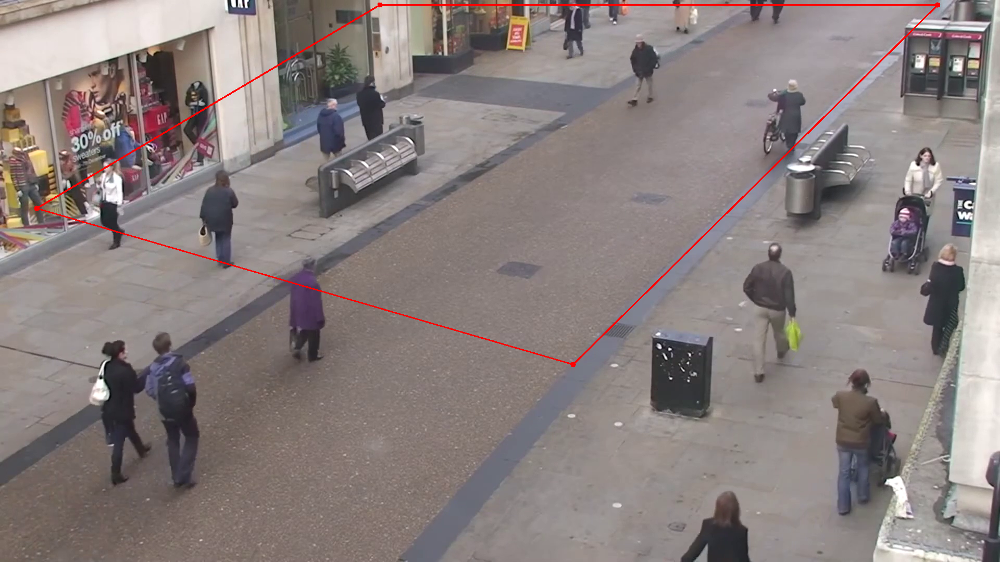

In [ ]:
temp = cv2.imread("frames/350.png")
# Pixel position to draw at

r1,c1= 70 , 400
r2,c2= 1100, 700
r3,c3= 1800, 9
r4,c4 = 729, 9

height, width, col = temp.shape

temp=cv2.circle(temp,(r1, c1), 5, (0,0,255), -1)
temp=cv2.circle(temp,(r2, c2), 5, (0,0,255), -1)
temp=cv2.circle(temp,(r3, c3), 5, (0,0,255), -1)
temp=cv2.circle(temp,(r4, c4), 5, (0,0,255), -1)
temp=cv2.line(temp,(r1,c1),(r2,c2), (0,0,255), 2)
temp=cv2.line(temp,(r2,c2),(r3,c3), (0,0,255), 2)
temp=cv2.line(temp,(r3,c3),(r4,c4), (0,0,255), 2)
temp=cv2.line(temp,(r4,c4),(r1,c1), (0,0,255), 2)

cv2_imshow(temp)

compute the transformation matrix and the transformed image

In [ ]:
def compute_perspective_transform(corner_points,width,height,img):
	# Create an array out of the 4 corner points
	corner_points_array = np.float32(corner_points)
	# Create an array with the parameters (the dimensions) required to build the matrix
	img_params = np.float32([[0,0],[width,0],[0,height],[width,height]])
	# Compute and return the transformation matrix
	matrix = cv2.getPerspectiveTransform(corner_points_array,img_params) 
	img_transformed = cv2.warpPerspective(img,matrix,(width,height))
	return matrix,img_transformed


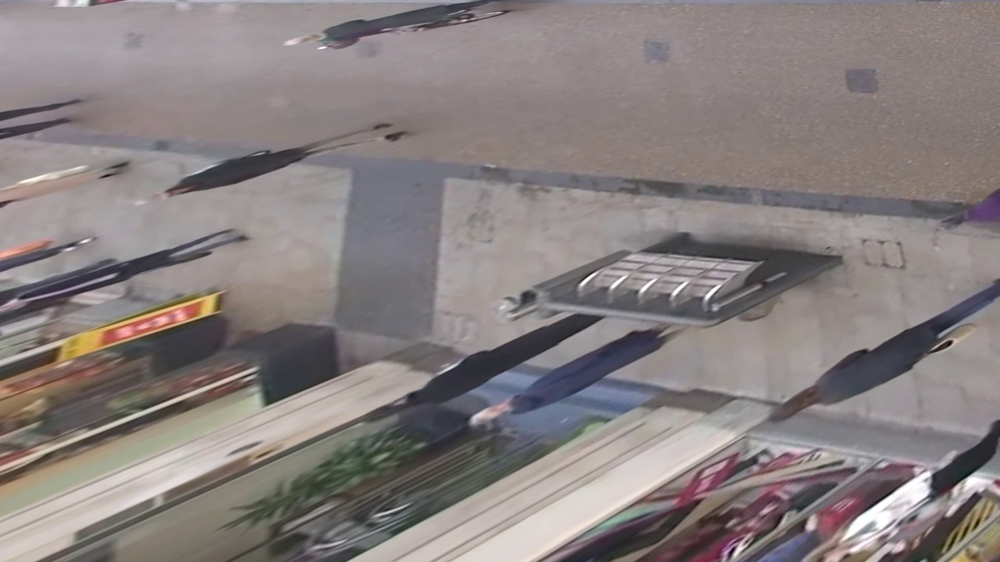

[[ 7.89491929e-17  9.82424590e+00 -8.84182131e+01]
 [-1.61984266e+00 -1.64094047e+00  2.93048526e+03]
 [ 8.02596792e-04  2.36121242e-03  1.00000000e+00]]


In [ ]:
mat,trans_img=compute_perspective_transform(((r3,c3),(r2,c2),(r4,c4),(r1,c1)),width,height,img);
cv2_imshow(trans_img)
print(mat)

use visualizer to draw the predictions on the image.

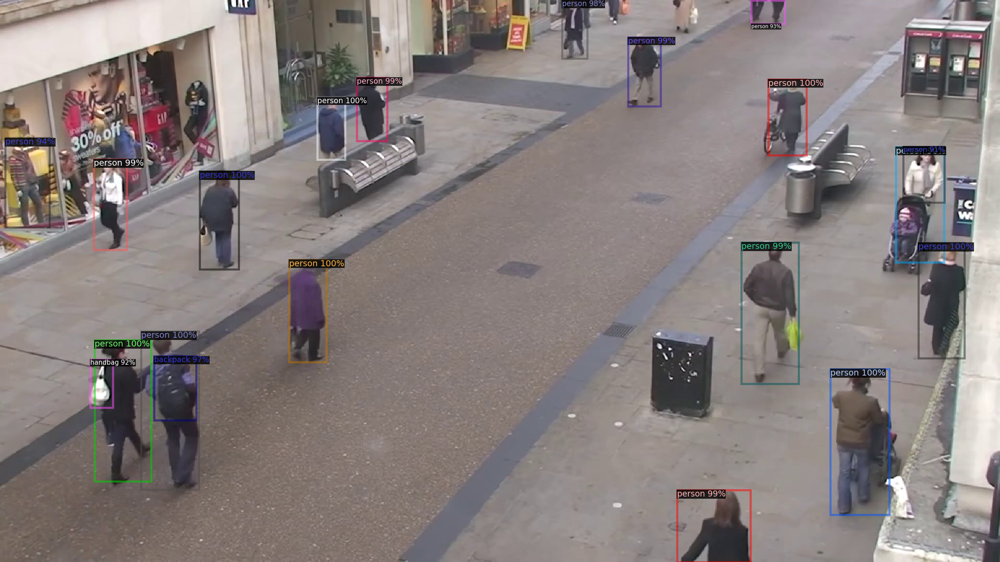

In [ ]:
v = Visualizer(img[:, :, ::1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::1])

get the class and bounding box coordinates for the objects

In [ ]:
classes=outputs['instances'].pred_classes.cpu().numpy()
print(classes)
bbox=outputs['instances'].pred_boxes.tensor.cpu().numpy()
print(bbox)

[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0 24  0  0 26  0  0]
[[1.5944830e+03 7.0900049e+02 1.7075129e+03 9.8944720e+02]
 [3.8297174e+02 3.2938956e+02 4.5852655e+02 5.1766809e+02]
 [5.5493817e+02 4.9893988e+02 6.2700128e+02 6.9591168e+02]
 [1.8171048e+02 6.5374500e+02 2.9027014e+02 9.2538239e+02]
 [2.7122247e+02 6.3691937e+02 3.8192398e+02 9.4044598e+02]
 [1.4746223e+03 1.5220541e+02 1.5487250e+03 2.9800424e+02]
 [1.7632448e+03 4.6647247e+02 1.8516451e+03 6.8806964e+02]
 [6.0911444e+02 1.8639642e+02 6.6268481e+02 3.0706946e+02]
 [1.4236224e+03 4.6585919e+02 1.5331923e+03 7.3759998e+02]
 [1.2058196e+03 7.1400909e+01 1.2685068e+03 2.0410075e+02]
 [6.8458691e+02 1.4921396e+02 7.4291949e+02 2.7122336e+02]
 [1.7959990e+02 3.0567679e+02 2.4299693e+02 4.8006155e+02]
 [1.2997985e+03 9.4152722e+02 1.4407388e+03 1.0800000e+03]
 [1.0788828e+03 2.0382386e-01 1.1278146e+03 1.1268853e+02]
 [2.9590732e+02 6.8457654e+02 3.7635117e+02 8.0716522e+02]
 [9.7978544e+00 2.6528149e+02 9.4895653e+01 4.3675894

identity only persons (class=0)

In [ ]:
#identity only persons 
ind = np.where(classes==0)[0]
print(ind)
#identify bounding box of only persons
person=bbox[ind]

print(person)

print(person[0])

#total no. of persons
num= len(person)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 18 19]
[[1.5944830e+03 7.0900049e+02 1.7075129e+03 9.8944720e+02]
 [3.8297174e+02 3.2938956e+02 4.5852655e+02 5.1766809e+02]
 [5.5493817e+02 4.9893988e+02 6.2700128e+02 6.9591168e+02]
 [1.8171048e+02 6.5374500e+02 2.9027014e+02 9.2538239e+02]
 [2.7122247e+02 6.3691937e+02 3.8192398e+02 9.4044598e+02]
 [1.4746223e+03 1.5220541e+02 1.5487250e+03 2.9800424e+02]
 [1.7632448e+03 4.6647247e+02 1.8516451e+03 6.8806964e+02]
 [6.0911444e+02 1.8639642e+02 6.6268481e+02 3.0706946e+02]
 [1.4236224e+03 4.6585919e+02 1.5331923e+03 7.3759998e+02]
 [1.2058196e+03 7.1400909e+01 1.2685068e+03 2.0410075e+02]
 [6.8458691e+02 1.4921396e+02 7.4291949e+02 2.7122336e+02]
 [1.7959990e+02 3.0567679e+02 2.4299693e+02 4.8006155e+02]
 [1.2997985e+03 9.4152722e+02 1.4407388e+03 1.0800000e+03]
 [1.0788828e+03 2.0382386e-01 1.1278146e+03 1.1268853e+02]
 [9.7978544e+00 2.6528149e+02 9.4895653e+01 4.3675894e+02]
 [1.4424949e+03 1.0644819e+00 1.5065494e+03 4.5578613e+01]


In [ ]:
x1,y1,x2,y2 = person[0]
print(x1,y1,x2,y2)

1594.483 709.0005 1707.513 989.4472


make bounding box

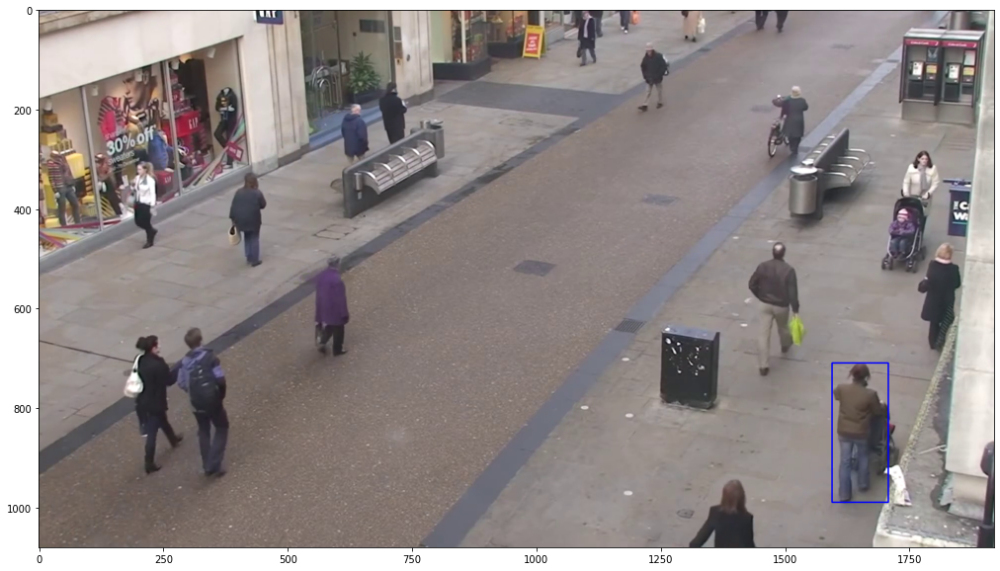

In [ ]:
img = cv2.imread('frames/350.png')
_ = cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

compute center

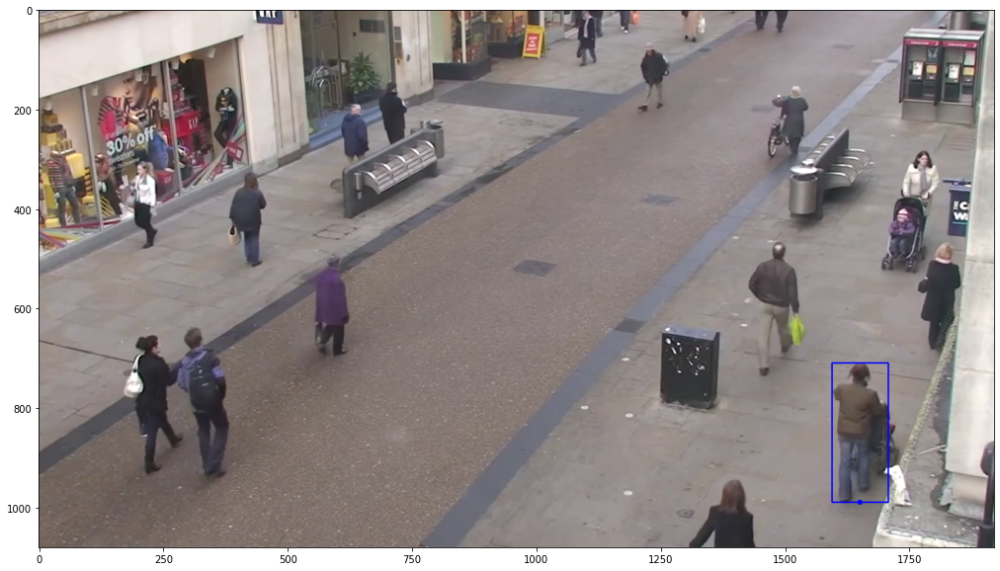

In [ ]:
x_center = int((x1+x2)/2)
y_center = int(y2)

center = (x_center, y_center)

_ = cv2.circle(img, center, 5, (255,0,0), -1)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

define a function which return the bottom center of every bbox

In [ ]:
def mid_point(img,person,idx):
  #get the coordinates
  x1,y1,x2,y2 = person[idx]
  _ = cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)
  
  #compute bottom center of bbox
  x_mid = int((x1+x2)/2)
  y_mid = int(y2)
  mid   = (x_mid,y_mid)
  
  _ = cv2.circle(img, mid, 5, (255,0,0), -1)
  cv2.putText(img, str(idx), mid, cv2.FONT_HERSHEY_SIMPLEX,1, (255, 255, 255), 2, cv2.LINE_AA)
  
  return mid

In [ ]:
print(mid_point(img,person,3))

(235, 925)


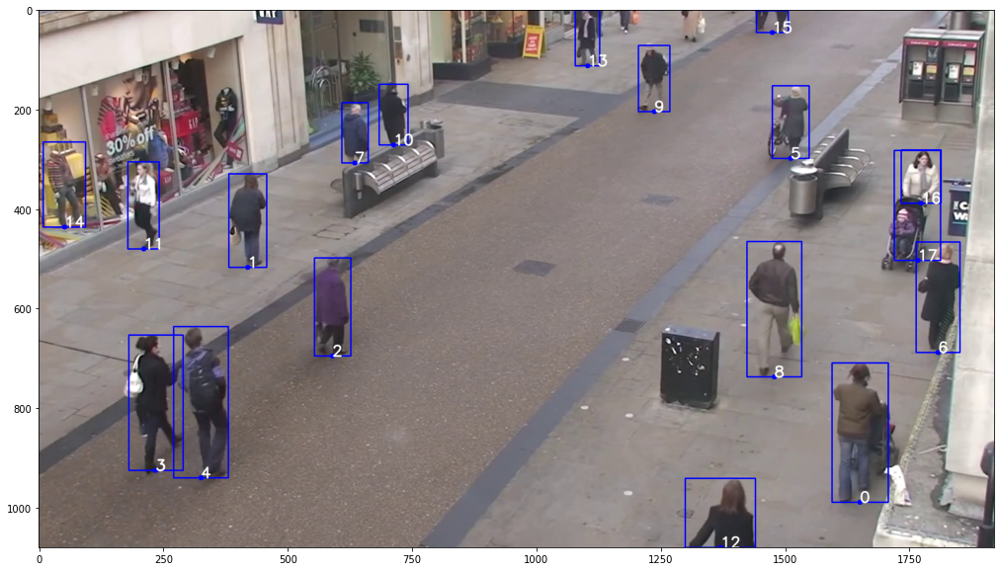

In [ ]:
#call the function
midpoints = [mid_point(img,person,i) for i in range(len(person))]
#visualize image
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

Apply the perspective transformation to every ground point which have been detected on the main frame.

In [ ]:
def compute_point_perspective_transformation(matrix,list_downoids):
	if len(list_downoids) == 0: 
		return (list_downoids)
	
	# Compute the new coordinates of our points
	list_points_to_detect = np.float32(list_downoids).reshape(-1, 1, 2)
	transformed_points = cv2.perspectiveTransform(list_points_to_detect, matrix)
	# Loop over the points and add them to the list that will be returned
	transformed_points_list = list()
	for i in range(0,transformed_points.shape[0]):
		transformed_points_list.append([transformed_points[i][0][0],transformed_points[i][0][1]])
	return transformed_points_list

In [ ]:
midpoints=compute_point_perspective_transformation(mat,midpoints)

compute the distance bw each person in the frame

In [ ]:
%%time
from scipy.spatial import distance
def compute_distance(midpoints,num):
  dist = np.zeros((num,num))
  for i in range(num):
    for j in range(i+1,num):
      if i!=j:
        dst = distance.euclidean(midpoints[i], midpoints[j])
        dist[i][j]=dst
  return dist

CPU times: user 44.1 ms, sys: 13.7 ms, total: 57.8 ms
Wall time: 206 ms


In [ ]:
dist= compute_distance(midpoints,num)
print(dist)

[[   0.          848.85552979  569.28289795  849.13934326  778.75292969
  1130.76708984  429.53137207 1189.79345703  273.28112793 1397.38623047
  1270.88537598 1076.61486816  207.05747986 1758.60754395 1322.37792969
  1975.52270508  958.70300293  724.8614502 ]
 [   0.            0.          351.74633789  756.777771    740.19561768
  1121.7611084   882.07214355  645.66461182  731.02813721 1216.79492188
   789.40936279  241.25128174  836.47442627 1483.90844727  486.42333984
  1829.13623047 1104.1451416   969.50128174]
 [   0.            0.            0.          505.76559448  464.00430298
  1220.52563477  757.32763672  925.62176514  556.92095947 1389.94433594
  1054.48364258  536.93286133  505.84402466 1702.53015137  773.38812256
  2010.33422852 1137.72607422  946.82867432]
 [   0.            0.            0.            0.           71.68547821
  1722.39624023 1184.12121582 1395.12561035  971.96820068 1895.15356445
  1533.37854004  812.79882812  670.47692871 2201.94897461  967.28851318
 

find the person violating the threshold to maintain social distancing

In [ ]:
%%time
def find_closest(dist,num,thresh):
  p1=[]
  p2=[]
  d=[]
  for i in range(num):
    for j in range(i,num):
      if( (i!=j) & (dist[i][j]<=thresh)):
        p1.append(i)
        p2.append(j)
        d.append(dist[i][j])
  return p1,p2,d

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.39 µs


In [ ]:
import pandas as pd

thresh=120
p1,p2,d=find_closest(dist,num,thresh)
df = pd.DataFrame({"p1":p1,"p2":p2,"dist":d})
df

,p1,p2,dist
0,3,4,71.685478


make violations to red

In [ ]:
def change_2_red(img,person,p1,p2):
  risky = np.unique(p1+p2)
  for i in risky:
    x1,y1,x2,y2 = person[i]
    _ = cv2.rectangle(img, (x1, y1), (x2, y2), (0,0,255), 2)  
  return img

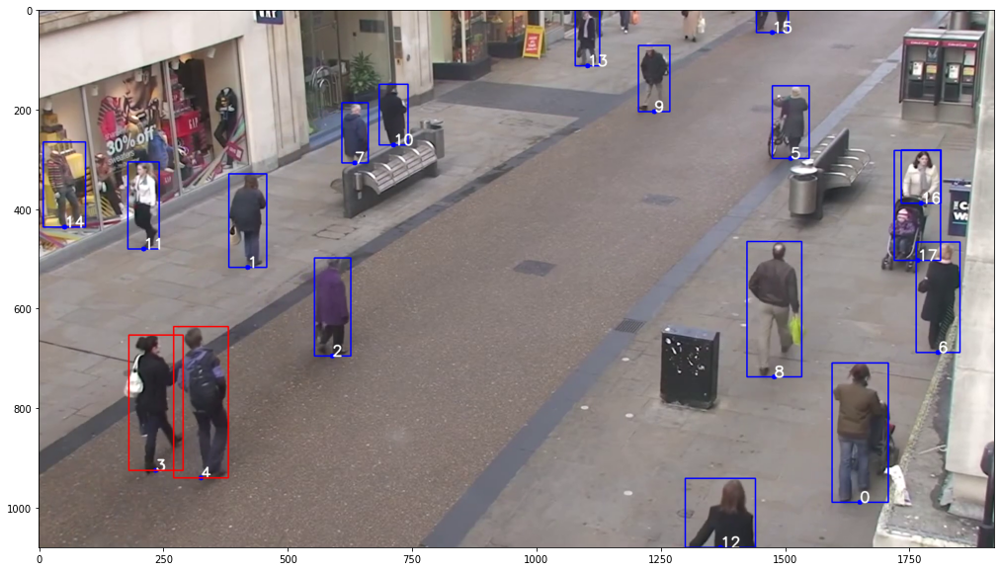

In [ ]:
img = change_2_red(img,person,p1,p2)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

# Processing the above steps for each frame

In [ ]:
import os
import re

names=os.listdir('frames/')
names.sort(key=lambda f: int(re.sub('\D', '', f)))

visualizing the movement of people through perspective transform

In [ ]:
def movement_vis(h,w,midpoints,num,p1,p2):
  screen=np.ones([h,w,3],dtype=float)*255
  for i in range(num):
    if (i in p1) or (i in p2):
      screen=cv2.circle(screen,(midpoints[i][0],midpoints[i][1]), 8, (0,0,255), -1)
    else:
      screen=cv2.circle(screen,(midpoints[i][0],midpoints[i][1]), 8, (255,0,0), -1)
  return screen;

In [ ]:
def find_closest_people(name,thresh):
  img = cv2.imread('frames/'+name)
  height, width, col = img.shape
  outputs = predictor(img)
  classes=outputs['instances'].pred_classes.cpu().numpy()
  bbox=outputs['instances'].pred_boxes.tensor.cpu().numpy()
  ind = np.where(classes==0)[0]
  person=bbox[ind]
  midpoints = [mid_point(img,person,i) for i in range(len(person))]
  r1,c1= 70 , 400
  r2,c2= 1100, 700
  r3,c3= 1800, 9
  r4,c4 = 729, 9
  mat,trans_img=compute_perspective_transform(((r3,c3),(r2,c2),(r4,c4),(r1,c1)),width,height,img);
  midpoints=compute_point_perspective_transformation(mat,midpoints)
  num = len(midpoints)
  dist= compute_distance(midpoints,num)
  p1,p2,d=find_closest(dist,num,thresh)
  pos=movement_vis(height, width,midpoints,num,p1,p2);
  img = change_2_red(img,person,p1,p2)
  r1,c1= 70 , 400
  r2,c2= 1100, 700
  r3,c3= 1800, 9
  r4,c4 = 729, 9
  img=cv2.line(img,(r1,c1),(r2,c2), (0,0,255), 2)
  img=cv2.line(img,(r2,c2),(r3,c3), (0,0,255), 2)
  img=cv2.line(img,(r3,c3),(r4,c4), (0,0,255), 2)
  img=cv2.line(img,(r4,c4),(r1,c1), (0,0,255), 2)
  cv2.imwrite('frames/'+name,img)
  cv2.imwrite('position/'+name,pos);
  return 0

In [ ]:
#!rm -r position/*
!mkdir position/

from tqdm import tqdm
thresh=120
_ = [find_closest_people(names[i],thresh) for i in tqdm(range(len(names))) ]

100%|██████████| 624/624 [05:12<00:00,  2.00it/s]


# Saving the visualizations

In [ ]:
%%time
frames = os.listdir('frames/')
frames.sort(key=lambda f: int(re.sub('\D', '', f)))

frame_array=[]

for i in range(len(frames)):
    
    #reading each files
    img = cv2.imread('frames/'+frames[i])

    height, width, layers = img.shape
    size = (width,height)
    
    #inserting the frames into an image array
    frame_array.append(img)

out = cv2.VideoWriter('output.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 25, size)
 
for i in range(len(frame_array)):
    # writing to a image array
    out.write(frame_array[i])
out.release()

CPU times: user 33.3 s, sys: 2.02 s, total: 35.3 s
Wall time: 37 s


In [ ]:
%%time
position = os.listdir('position/')
position.sort(key=lambda f: int(re.sub('\D', '', f)))

position_array=[]

for i in range(len(position)):
    
    #reading each files
    img = cv2.imread('position/'+position[i])

    height, width, layers = img.shape
    size = (width,height)
    
    #inserting the frames into an image array
    position_array.append(img)

out = cv2.VideoWriter('position_output.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 25, size)
 
for i in range(len(position_array)):
    # writing to a image array
    out.write(position_array[i])
out.release()

CPU times: user 15.6 s, sys: 3.29 s, total: 18.9 s
Wall time: 20 s
